# Cloud Vision API : Guide to practical use

## Why this project ?

I've always been passionated about how cutting-edge research (in particular AI) is translated into real world impact. The truth is that we live in a world where great research sometimes take several years before actually being deployed and making an impact. 

Therefore, I wanted to make the best AI algorithms (starting with computer vision) accessible in a few lines of code, so that:
* Developers without AI expertise can use the best algorithms in their code without struggling with any integration
* AI researchers can maximize the impact of their code, and go beyond the "demo" stage.   
* People can quickly see if a given open-source AI algorithm can work well in their use-case.  

Although, this project is still at its infancy, it can be compared to:
* The computer vision APIs from [Microsoft](https://azure.microsoft.com/en-us/services/cognitive-services/computer-vision/#features), [Amazon](https://aws.amazon.com/rekognition/), and [Google](https://cloud.google.com/vision). However, these APIs do not propose most of the algorithms that are included in this API.
* What [Hugging Face](https://huggingface.co/) is doing for Natural Language Processing. HF has actually been a great source of inspiration here for me, since any developper can build state-of-the-art NLP with a few lines of code thanks to their library.

## API Content

The algorithms from this API are all based on great notebooks / github repositories, which I highly recommend to look at: 
* **Object Detection**: locates and classifies objects in a given picture. <br />
    * Option 1: Based on the paper [DETR: End-to-End Object Detection With Transformers](https://alcinos.github.io/detr_page/)
    * Option 2: Based on the paper ["EfficientDet: Scalable and Efficient Object Detection"](https://arxiv.org/pdf/1911.09070.pdf), ranked #2 as of May 2020 on [COCO's Test set](https://paperswithcode.com/sota/object-detection-on-coco).
* **Panoptic Segmentation**: Each pixel is assigned a class label and all object instances are uniquely segmented.
    * Based on the paper [DETR: End-to-End Object Detection With Transformers](https://alcinos.github.io/detr_page/)
* **Monocular Depth Estimation**:  estimates how far each pixel is from the camera <br />
    * Based on the paper ["From Big to Small: Multi-Scale Local Planar Guidance for Monocular Depth Estimation"](https://arxiv.org/pdf/1907.10326v5.pdf), currently state-of-the-art on [KITTI and MIT Datasets](https://paperswithcode.com/task/monocular-depth-estimation), and its [PyTorch implementation](https://github.com/Navhkrin/Bts-PyTorch). A video of the algorithm's results can be found [here](https://www.youtube.com/watch?v=ekezJiGaiQk&feature=youtu.be)

## Limits of the API

* Since the server cost is currently on me, I cannot use a powerful server, and therefore, large images may fail. 
* When you submit an image, the results may take about 20 seconds to arrive.
* The algorithms provided here work more or well according to the context. For more details about the algorithm's performances, please refer to the papers aforementioned.
* Keep in mind that this is a side-project and not a finished product yet! Although I do my best to keep everything working and resilient, the results may be disappointing, and the server may fail (apologies if that's the case). In any case, please share your feedback with me (sebderhy@gmail.com), so that I can improve it accoridingly.   

# Let's get started !

To use this vision API, you only need the most basic python libraries, 
in particular requests to perform the HTTP requests, and PIL (Pillow) to manipulate images

Let's choose an image URL and download it

In [1]:
import requests
import json
import time
from PIL import Image
import requests
import io
from io import BytesIO
from functools import wraps
from time import time

In [2]:
URL_IMG = "https://royalbubbles.files.wordpress.com/2018/01/18157540_1722500771109745_7941673173726394531_n.jpg?w=256&h=256&crop=1"
URL_IMG = "https://mi.eng.cam.ac.uk/research/projects/VideoRec/CamVid/pr/0016E5_00390.png"
# URL_IMG = "https://i.ytimg.com/vi/1Kxn1xipm-A/maxresdefault.jpg"
# URL_IMG = "https://ttnotes.com/images/sheinkin-street-tel-aviv.jpg"
# URL_IMG = "https://nocamels.com/wp-content/uploads/2019/06/yandex-light.jpeg"
# URL_IMG = "https://i.pinimg.com/originals/e4/a2/d2/e4a2d21a1e545722ec3e28f85e9b1ffa.jpg"
# URL_IMG = "https://www.sparkbit.pl/wp-content/uploads/2019/07/vidar-nordli-mathisen-Kuu5mmxkwW4-unsplash.jpg"
# URL_IMG = "https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcQAGJWkHjFoyVewMNzdmzFIIE5bkZj3D7bBnkd4FzQoz7-WOppI&usqp=CAU"
# URL_IMG = "https://bkivey.files.wordpress.com/2018/12/OR-TV-Hwy-looking-West-181231.jpg?w=584"
# URL_IMG = "https://www.go-telaviv.com/images/driving-in-israel-tel-aviv-traffic-jam1.jpg"
# URL_IMG = "https://github.com/zylo117/Yet-Another-EfficientDet-Pytorch/blob/master/test/img.png?raw=true"

response = requests.get(URL_IMG)
img_pil = Image.open(BytesIO(response.content))

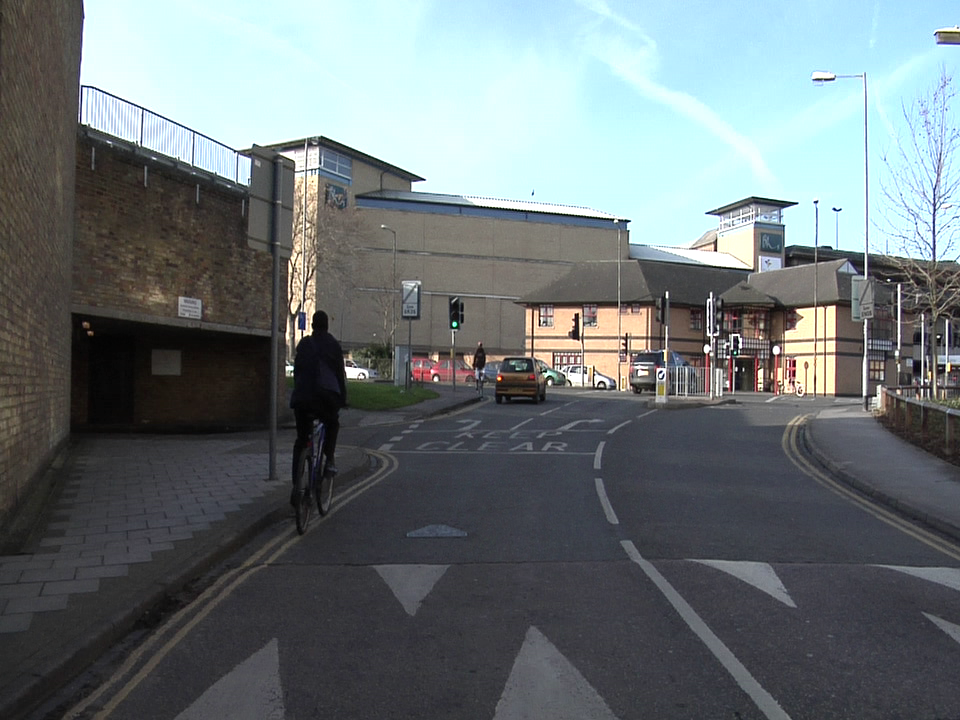

In [3]:
img_pil

In [4]:
img_pil.size

(960, 720)

In [5]:
name_img = 'test_img.png'

In [6]:
img_pil.save(name_img)

Please note that the API currently does NOT support large images, 
so we measure how big is the image and check that it does not go over ~1.5 MB. 

In [7]:
import os
os.path.getsize('test_img.png')

779654

This is the API URL that we will call

In [8]:
URL_APP = "http://visionapi.cloud/"
# URL_APP = "http://localhost/"

# Aux Functions

The functions enable you to make an API call and easily manipulate the images. Feel free to remove the decorators if you don't want it to display how long the call took. 

## Timing Decorator

In [9]:
from functools import wraps
from time import time

def timing(f):
    @wraps(f)
    def wrapper(*args, **kwargs):
        start = time()
        result = f(*args, **kwargs)
        end = time()
        print('Elapsed time: {}'.format(end-start))
        return result
    return wrapper

## Image / Bytes conversion utils

In [10]:
def response2img(r):
    dataBytesIO = BytesIO(r.content)
    img =Image.open(dataBytesIO)
    return img 

In [11]:
def image_to_byte_array(image:Image):
  imgByteArr = BytesIO()
  image.save(imgByteArr, format=image.format)
  imgByteArr = imgByteArr.getvalue()
  return imgByteArr

In [12]:
import io

def to_bytes_format(im:Image.Image, format='png'):
    "Convert to bytes, default to PNG format"
    arr = io.BytesIO()
    im.save(arr, format=format)
    return arr.getvalue()

The function below is optional (it is used only to renormalize the output image). For example, it is mostly used in the depth demo 

In [13]:
import numpy as np
from PIL import Image

def do_normalize(arr):
    """
    Linear normalization
    http://en.wikipedia.org/wiki/Normalization_%28image_processing%29
    """
    arr = arr.astype('float')
    # Do not touch the alpha channel
    for i in range(3):
        minval = arr[...,i].min()
        maxval = arr[...,i].max()
        if minval != maxval:
            arr[...,i] -= minval
            arr[...,i] *= (255.0/(maxval-minval))
    return arr

def normalize(img_pil):
#     img = Image.open(FILENAME).convert('RGBA')
    img = img_pil.convert('RGBA')
    arr = np.array(img)
    new_img = Image.fromarray(do_normalize(arr).astype('uint8'),'RGBA')
#     new_img.save('/tmp/normalized.png')
    return new_img

## API Call helpers

All the API functions can be called either from:
* Local path of an image 
* PIL image object
* URL of an image

In [14]:
@timing
def fileImgAPICall(path_img, api_path):
    # api-endpoint 
    API_ENDPOINT = f"{URL_APP}{api_path}"

    # data to be sent to api 
    files = {'file': open(path_img, 'rb')}

    # sending post request and saving response as response object 
    r = requests.post(url = API_ENDPOINT, files=files) 
    return r

@timing
def pilImgAPICall(img_pil, api_path):
    # api-endpoint 
    API_ENDPOINT = f"{URL_APP}{api_path}"
    
#     img_bytes = image_to_byte_array(img_pil)
    img_bytes = to_bytes_format(img_pil)
    img_bytes_io = BytesIO(img_bytes)

    # data to be sent to api 
    files = {'file':img_bytes_io}

    # sending post request and saving response as response object 
    r = requests.post(url = API_ENDPOINT, files=files) 
    return r

@timing
def URLImgAPICall(url, api_path):
    API_ENDPOINT = f"{URL_APP}{api_path}"

    # data to be sent to api 
    params = {'url': url}
    files = {'file': open('dummy.txt', 'w+')}

    # sending post request and saving response as response object 
    r = requests.post(url = API_ENDPOINT, files=files, params = params)
    assert r.status_code==200
    return r

# Object Detection 1: EfficientDet

Depth estimation is the task of giving the distance of each pixel to the camera. It is key in domains like autonomous driving, where the car needs to understand how far are each components.

NOTE: this algorithm was trained on autonomous driving datasets, and therefore will not work well on images that are not similar to what a car sees on the road.

In [51]:
import numpy as np
import webcolors
import cv2

In [52]:
name_img='test_img.png'
model_name='efficientdet-d4'

In [53]:
r = fileImgAPICall(name_img,f'objdet/{model_name}/')

assert r.status_code==200

Elapsed time: 8.015301942825317


In [54]:
r.json()['rois']

'[[287.83648681640625, 312.06353759765625, 348.6583557128906, 502.80926513671875], [559.8912963867188, 364.8612060546875, 616.8807983398438, 390.2683410644531], [494.4370422363281, 357.09912109375, 547.8958129882812, 404.51251220703125], [629.6827392578125, 349.0545349121094, 699.669189453125, 394.0245056152344], [423.39739990234375, 358.7596435546875, 476.67889404296875, 384.32745361328125], [449.25048828125, 297.9107360839844, 463.0792541503906, 330.54925537109375], [537.5802612304688, 361.9699401855469, 567.4785766601562, 387.25335693359375], [473.2038879394531, 340.602294921875, 488.18182373046875, 387.5921936035156], [344.4435119628906, 362.58563232421875, 372.12664794921875, 381.01611328125], [478.9376525878906, 362.0247497558594, 505.50787353515625, 384.6299133300781], [568.637451171875, 313.4263000488281, 581.1572875976562, 340.56292724609375], [732.2196044921875, 335.4908142089844, 740.0031127929688, 356.2831115722656]]'

In [55]:
rois = eval(r.json()['rois'])
rois = np.array(rois)

class_ids = eval(r.json()['class_ids'])
class_ids = np.array(class_ids)

scores = eval(r.json()['scores'])
scores = np.array(scores)

In [56]:
obj_list = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
            'fire hydrant', '', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep',
            'cow', 'elephant', 'bear', 'zebra', 'giraffe', '', 'backpack', 'umbrella', '', '', 'handbag', 'tie',
            'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
            'skateboard', 'surfboard', 'tennis racket', 'bottle', '', 'wine glass', 'cup', 'fork', 'knife', 'spoon',
            'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut',
            'cake', 'chair', 'couch', 'potted plant', 'bed', '', 'dining table', '', '', 'toilet', '', 'tv',
            'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink',
            'refrigerator', '', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
            'toothbrush']

In [57]:
def plot_one_box(img, coord, label=None, score=None, color=None, line_thickness=None):
    tl = line_thickness or int(round(0.001 * max(img.shape[0:2])))  # line thickness
    color = color
    c1, c2 = (int(coord[0]), int(coord[1])), (int(coord[2]), int(coord[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl)
    if label:
        tf = max(tl - 2, 1)  # font thickness
        s_size = cv2.getTextSize(str('{:.0%}'.format(score)),0, fontScale=float(tl) / 3, thickness=tf)[0]
        t_size = cv2.getTextSize(label, 0, fontScale=float(tl) / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0]+s_size[0]+15, c1[1] - t_size[1] -3
        cv2.rectangle(img, c1, c2 , color, -1)  # filled
        cv2.putText(img, '{}: {:.0%}'.format(label, score), (c1[0],c1[1] - 2), 0, float(tl) / 3, [0, 0, 0], thickness=tf, lineType=cv2.FONT_HERSHEY_SIMPLEX)


In [58]:
STANDARD_COLORS = [
    'LawnGreen', 'Chartreuse', 'Aqua','Beige', 'Azure','BlanchedAlmond','Bisque',
    'Aquamarine', 'BlueViolet', 'BurlyWood', 'CadetBlue', 'AntiqueWhite',
    'Chocolate', 'Coral', 'CornflowerBlue', 'Cornsilk', 'Crimson', 'Cyan',
    'DarkCyan', 'DarkGoldenRod', 'DarkGrey', 'DarkKhaki', 'DarkOrange',
    'DarkOrchid', 'DarkSalmon', 'DarkSeaGreen', 'DarkTurquoise', 'DarkViolet',
    'DeepPink', 'DeepSkyBlue', 'DodgerBlue', 'FireBrick', 'FloralWhite',
    'ForestGreen', 'Fuchsia', 'Gainsboro', 'GhostWhite', 'Gold', 'GoldenRod',
    'Salmon', 'Tan', 'HoneyDew', 'HotPink', 'IndianRed', 'Ivory', 'Khaki',
    'Lavender', 'LavenderBlush', 'AliceBlue', 'LemonChiffon', 'LightBlue',
    'LightCoral', 'LightCyan', 'LightGoldenRodYellow', 'LightGray', 'LightGrey',
    'LightGreen', 'LightPink', 'LightSalmon', 'LightSeaGreen', 'LightSkyBlue',
    'LightSlateGray', 'LightSlateGrey', 'LightSteelBlue', 'LightYellow', 'Lime',
    'LimeGreen', 'Linen', 'Magenta', 'MediumAquaMarine', 'MediumOrchid',
    'MediumPurple', 'MediumSeaGreen', 'MediumSlateBlue', 'MediumSpringGreen',
    'MediumTurquoise', 'MediumVioletRed', 'MintCream', 'MistyRose', 'Moccasin',
    'NavajoWhite', 'OldLace', 'Olive', 'OliveDrab', 'Orange', 'OrangeRed',
    'Orchid', 'PaleGoldenRod', 'PaleGreen', 'PaleTurquoise', 'PaleVioletRed',
    'PapayaWhip', 'PeachPuff', 'Peru', 'Pink', 'Plum', 'PowderBlue', 'Purple',
    'Red', 'RosyBrown', 'RoyalBlue', 'SaddleBrown', 'Green', 'SandyBrown',
    'SeaGreen', 'SeaShell', 'Sienna', 'Silver', 'SkyBlue', 'SlateBlue',
    'SlateGray', 'SlateGrey', 'Snow', 'SpringGreen', 'SteelBlue', 'GreenYellow',
    'Teal', 'Thistle', 'Tomato', 'Turquoise', 'Violet', 'Wheat', 'White',
    'WhiteSmoke', 'Yellow', 'YellowGreen'
]

In [59]:
def from_colorname_to_bgr(color):
    rgb_color=webcolors.name_to_rgb(color)
    result=(rgb_color.blue,rgb_color.green,rgb_color.red)
    return result

In [60]:
def standard_to_bgr(list_color_name):
    standard= []
    for i in range(len(list_color_name)-36): #-36 used to match the len(obj_list)
        standard.append(from_colorname_to_bgr(list_color_name[i]))
    return standard

In [61]:
def get_index_label(label, obj_list):
    index = int(obj_list.index(label))
    return index

In [62]:
color_list = standard_to_bgr(STANDARD_COLORS)

In [63]:
def display(rois,class_ids, scores, img, path_out, imshow=True, imwrite=False):
    if len(rois) == 0:
        return

    for j in range(len(rois)):
        if scores[j]>0.4: continue
        x1, y1, x2, y2 = rois[j].astype(np.int)
        obj = obj_list[class_ids[j]]
        score = float(scores[j])
        plot_one_box(img, [x1, y1, x2, y2], label=obj, score=score, color=color_list[get_index_label(obj, obj_list)])

    if imshow:
        cv2.imshow('img', img)
        cv2.waitKey(0)

    if imwrite:
        cv2.imwrite(path_out, img)

In [64]:
img_cv = cv2.imread('test_img.png')

In [65]:
display(rois, class_ids, scores, img_cv, 'img_out/objdet.jpg', imshow=False, imwrite=True)

In [66]:
## VIZ FOR OBJECT DETECTION
import matplotlib.pyplot as plt

def vis_bbox(img_pil, bbox, label=None, score=None,
             instance_colors=None, alpha=1., linewidth=2., ax=None, min_score=0.4):
    """Visualize bounding boxes inside the image.
    Args:
        img (~numpy.ndarray): An array of shape :math:`(3, height, width)`.
            This is in RGB format and the range of its value is
            :math:`[0, 255]`. If this is :obj:`None`, no image is displayed.
        bbox (~numpy.ndarray): An array of shape :math:`(R, 4)`, where
            :math:`R` is the number of bounding boxes in the image.
            Each element is organized
            by :math:`(y_{min}, x_{min}, y_{max}, x_{max})` in the second axis.
        label (~numpy.ndarray): An integer array of shape :math:`(R,)`.
            The values correspond to id for label names stored in
            :obj:`label_names`. This is optional.
        score (~numpy.ndarray): A float array of shape :math:`(R,)`.
             Each value indicates how confident the prediction is.
             This is optional.
        label_names (iterable of strings): Name of labels ordered according
            to label ids. If this is :obj:`None`, labels will be skipped.
        instance_colors (iterable of tuples): List of colors.
            Each color is RGB format and the range of its values is
            :math:`[0, 255]`. The :obj:`i`-th element is the color used
            to visualize the :obj:`i`-th instance.
            If :obj:`instance_colors` is :obj:`None`, the red is used for
            all boxes.
        alpha (float): The value which determines transparency of the
            bounding boxes. The range of this value is :math:`[0, 1]`.
        linewidth (float): The thickness of the edges of the bounding boxes.
        ax (matplotlib.axes.Axis): The visualization is displayed on this
            axis. If this is :obj:`None` (default), a new axis is created.
    Returns:
        ~matploblib.axes.Axes:
        Returns the Axes object with the plot for further tweaking.
    from: https://github.com/chainer/chainercv
    """

    if label is not None and not len(bbox) == len(label):
        raise ValueError('The length of label must be same as that of bbox')
    if score is not None and not len(bbox) == len(score):
        raise ValueError('The length of score must be same as that of bbox')

    # Returns newly instantiated matplotlib.axes.Axes object if ax is None
    if ax is None:
        fig = plt.figure()
        # ax = fig.add_subplot(1, 1, 1)
#         h, w, _ = img.shape
        w, h = img_pil.size
        w_ = w / 60.0
        h_ = w_ * (h / w)
        fig.set_size_inches((w_, h_))
        ax = plt.axes([0, 0, 1, 1])
#     ax.imshow(img.astype(np.uint8))
    ax.imshow(img_pil)
    ax.axis('off')
    # If there is no bounding box to display, visualize the image and exit.
    if len(bbox) == 0:
        return fig, ax

    if instance_colors is None:
        # Red
        instance_colors = np.zeros((len(bbox), 3), dtype=np.float32)
        instance_colors[:, 0] = 51
        instance_colors[:, 1] = 51
        instance_colors[:, 2] = 224
    instance_colors = np.array(instance_colors)

    for i, bb in enumerate(bbox):
        if score[i]<min_score: 
            continue

        xy = (bb[0], bb[1])
        height = bb[3] - bb[1]
        width = bb[2] - bb[0]
        color = instance_colors[i % len(instance_colors)] / 255
        ax.add_patch(plt.Rectangle(
            xy, width, height, fill=False,
            edgecolor=color, linewidth=linewidth, alpha=alpha))

        caption = []
        caption.append(obj_list[label[i]])
        if(len(score) > 0):
            sc = int(score[i]*100)
            caption.append('{}%'.format(sc))

        if len(caption) > 0:
            face_color = np.array([225, 51, 123])/255
            ax.text(bb[0], bb[1],
                    ': '.join(caption),
                    fontsize=12,
                    color='black',
                    style='italic',
                    bbox={'facecolor': face_color, 'edgecolor': face_color, 'alpha': 1, 'pad': 0})
    return fig, ax

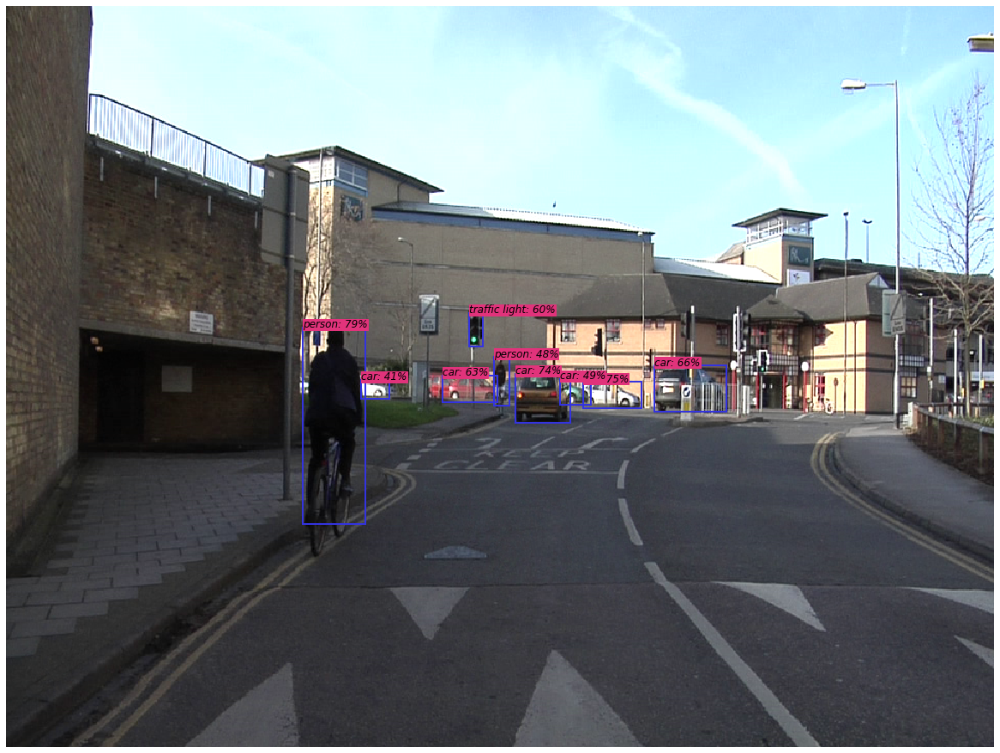

In [67]:
fig, ax = vis_bbox(img_pil=Image.open('test_img.png'), bbox=rois,
                   label=class_ids, score=scores)

In [68]:
def pltfigure2img(fig,ax):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi = 150)
    plt.close(fig) 
    buf.seek(0)
    img_pil_out = (Image.open(buf)).copy()
    buf.close()
    return img_pil_out

img_pil_out = pltfigure2img(fig,ax)

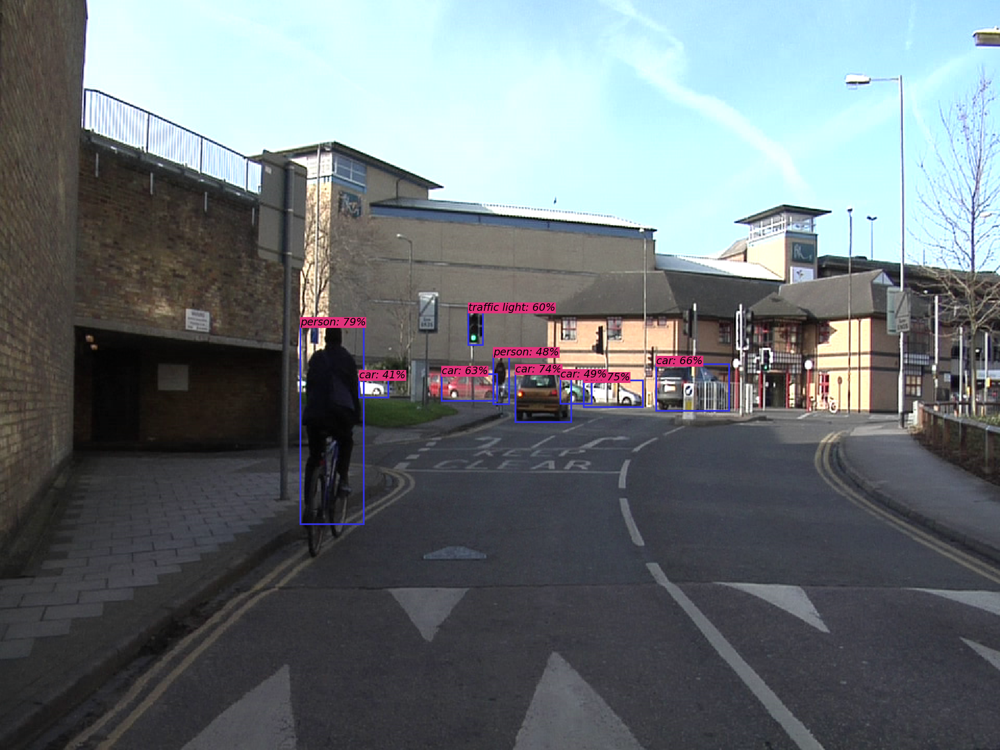

In [69]:
img_pil_out

In [70]:
img_pil_out.save(f'./img_out/{model_name}.png')

# Object Detection with DETR

DETR is an object detection algorithm from N. Carion et. al. (Facebook AI) based on the Transformers architecture, which is very popular in NLP. For more details and demo, please visit [DETR's website](https://alcinos.github.io/detr_page/)

In [71]:
URL_APP = "http://visionapi.cloud/"

In [72]:
@timing
def fileImgAPICall(path_img, api_path):
    # api-endpoint 
    API_ENDPOINT = f"{URL_APP}{api_path}"

    # data to be sent to api 
    files = {'file': open(path_img, 'rb')}

    # sending post request and saving response as response object 
    r = requests.post(url = API_ENDPOINT, files=files) 
    return r

In [73]:
name_img='test_img.png'
model_name='detr_resnet50'

In [74]:
r = fileImgAPICall(name_img,f'objdet/{model_name}/')

assert r.status_code==200

Elapsed time: 7.0547661781311035


In [75]:
import numpy as np

In [76]:
probas = eval(r.json()['probas'])
probas = np.array(probas)

keep = eval(r.json()['keep'])
keep = np.array(keep)

bboxes_scaled = eval(r.json()['bboxes_scaled'])
bboxes_scaled = np.array(bboxes_scaled)

In [77]:
# COCO classes
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [78]:
def plot_results(pil_img, prob, boxes):
    fig = plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{CLASSES[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()
    return fig,ax

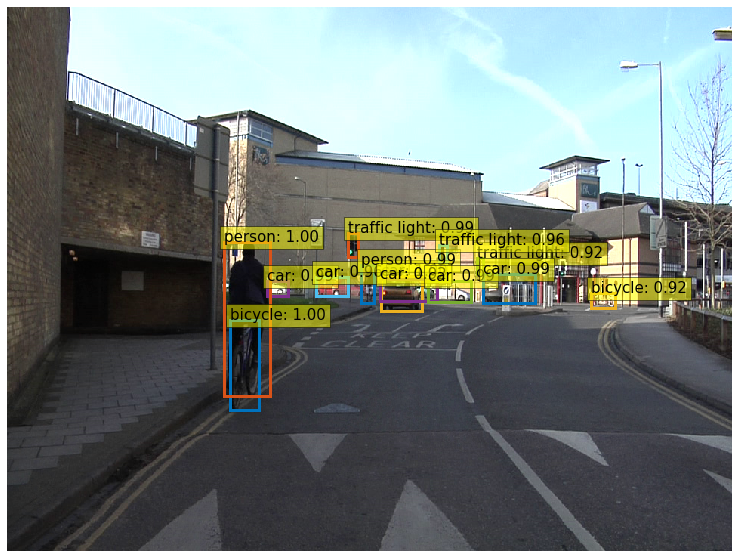

In [79]:
fig,ax = plot_results(img_in, probas[keep], bboxes_scaled)

In [80]:
# img_in = Image.open(name_img)
# img_in

In [81]:
def pltfigure2img(fig,ax):
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi = 150)
    plt.close(fig) 
    buf.seek(0)
    img_pil_out = (Image.open(buf)).copy()
    buf.close()
    return img_pil_out

img_pil_out = pltfigure2img(fig,ax)

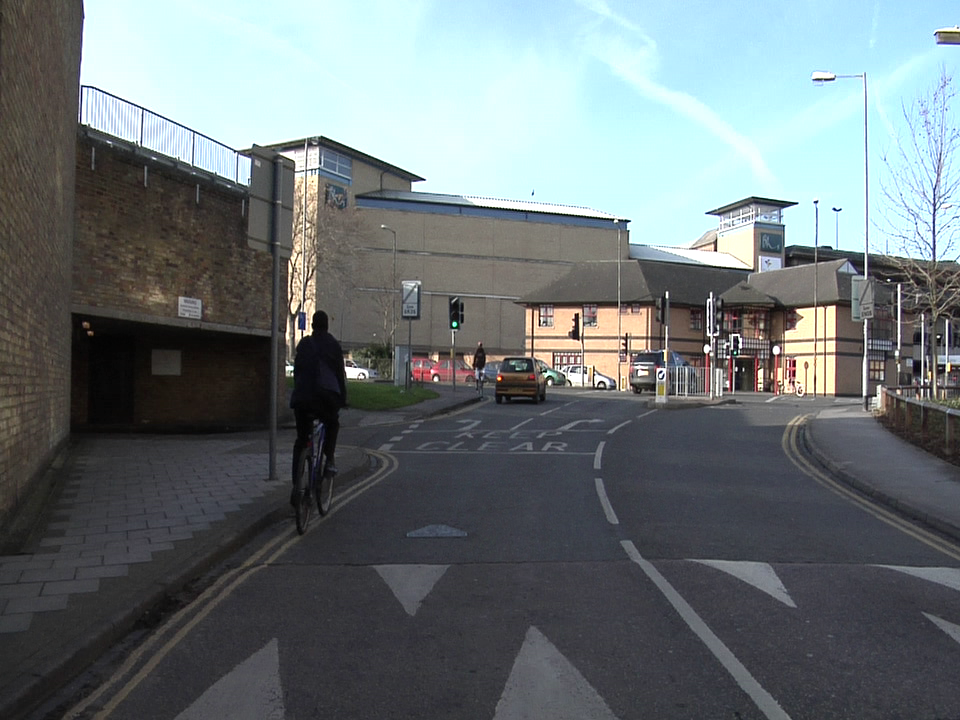

In [82]:
img_in

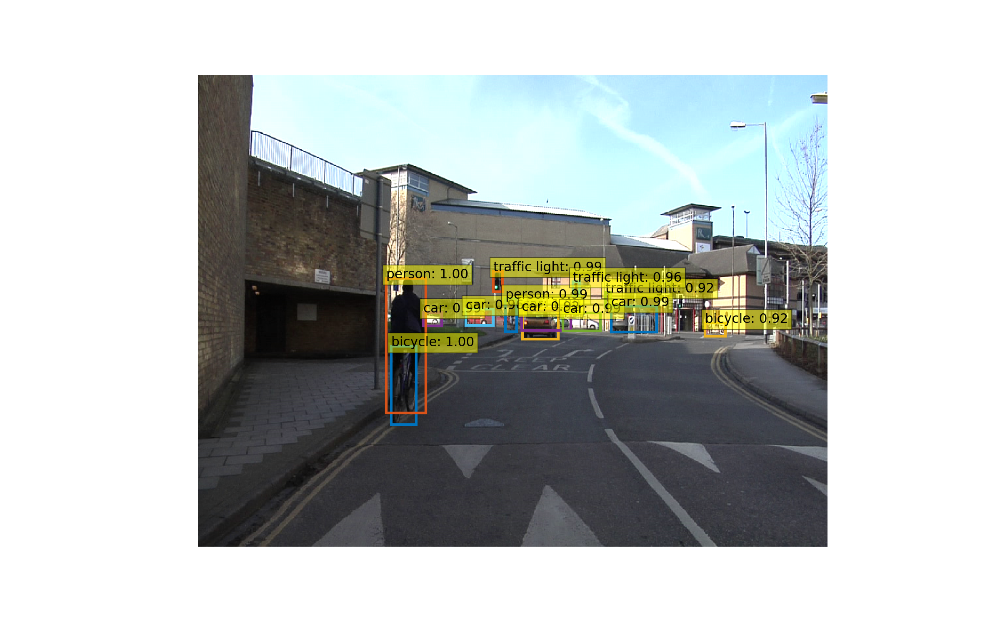

In [83]:
img_pil_out

In [91]:
img_pil_out.save(f'./img_out/{model_name}.png')

## Test Panoptic Segmentation

Semantic segmentation allows to have a per-pixel classification of the image. It is very useful in domains like Autonomous driving, where the car needs to have an accurate understanding of its surroundings

NOTE: this algorithm was trained on autonomous driving datasets, and therefore will not work well on images that are not similar to what a car sees on the road.

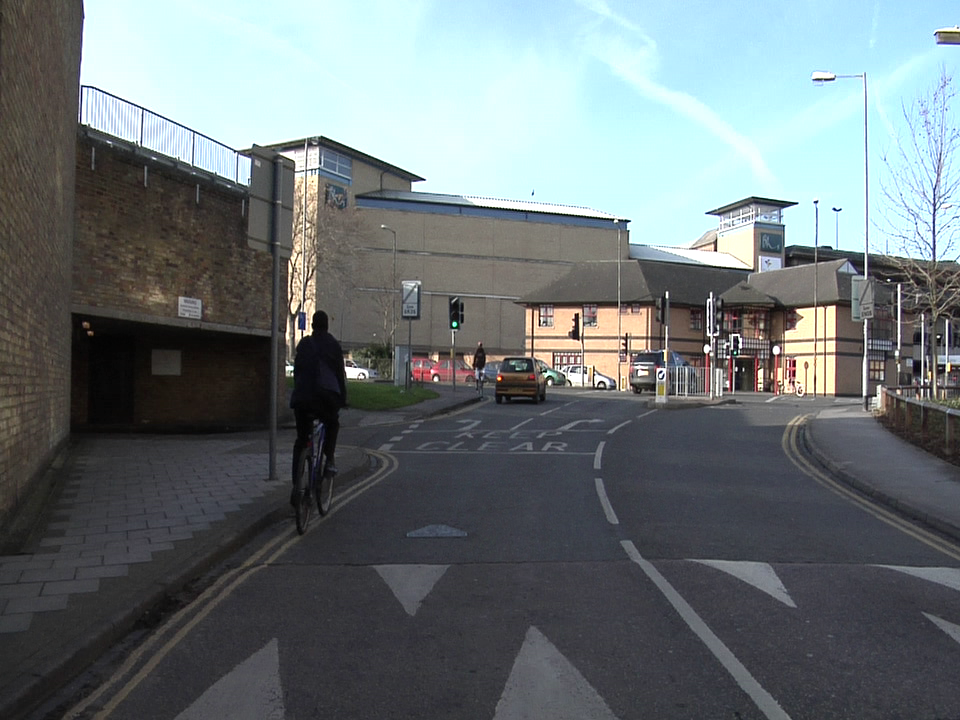

In [32]:
Image.open(name_img)

In [33]:
name_img='test_img.png'
model_name='detr_resnet101_panoptic'

In [34]:
r = fileImgAPICall(name_img,f'panopseg/{model_name}/')

assert r.status_code==200

Elapsed time: 14.68711543083191


In [35]:
img_out = response2img(r)
img_out.size

(960, 720)

In [36]:
# ! pip install git+https://github.com/cocodataset/panopticapi.git

In [37]:
import panopticapi
from panopticapi.utils import id2rgb, rgb2id

In [38]:
def rgb2id(color):
    if isinstance(color, np.ndarray) and len(color.shape) == 3:
        if color.dtype == np.uint8:
            color = color.astype(np.int32)
        return color[:, :, 0] + 256 * color[:, :, 1] + 256 * 256 * color[:, :, 2]
    return int(color[0] + 256 * color[1] + 256 * 256 * color[2])

In [39]:
import itertools
import seaborn as sns
import numpy
palette = itertools.cycle(sns.color_palette())

In [40]:
panoptic_seg = numpy.array(img_out, dtype=numpy.uint8).copy()
# We retrieve the ids corresponding to each mask
panoptic_seg_id = rgb2id(panoptic_seg)

# Finally we color each mask individually
panoptic_seg[:, :, :] = 0
for id in range(panoptic_seg_id.max() + 1):
    panoptic_seg[panoptic_seg_id == id] = numpy.asarray(next(palette)) * 255
# # plt.figure(figsize=(15,15))
# plt.figure(figsize=(15,15))
# plt.imshow(panoptic_seg,)
# plt.axis('off')
# plt.show()
panop_img = Image.fromarray(panoptic_seg)

In [41]:
panoptic_seg_id.max()

23

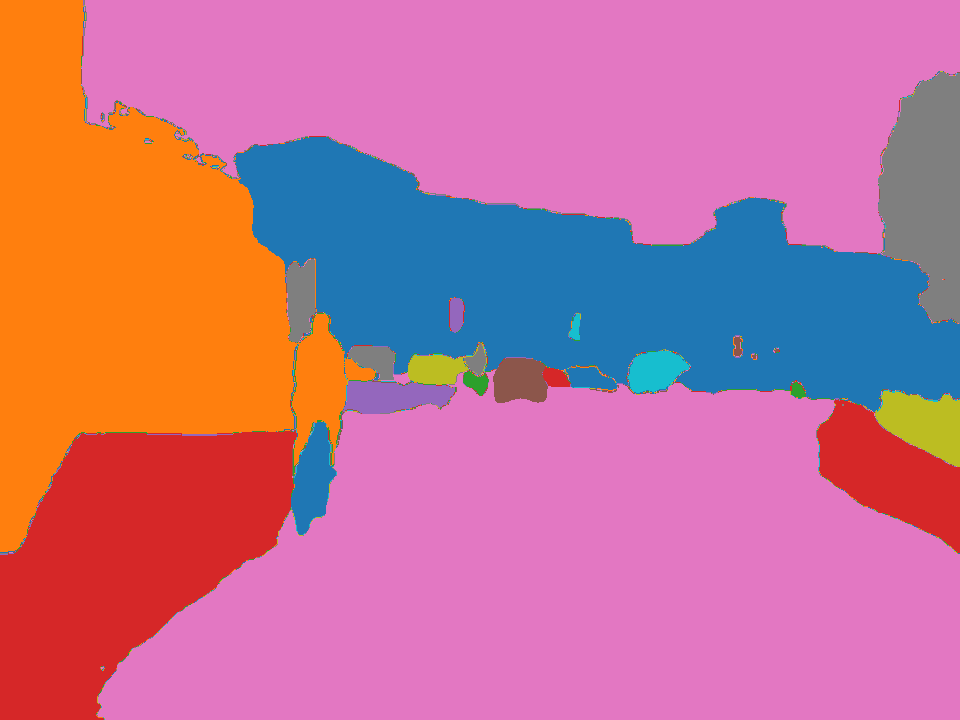

In [42]:
panop_img

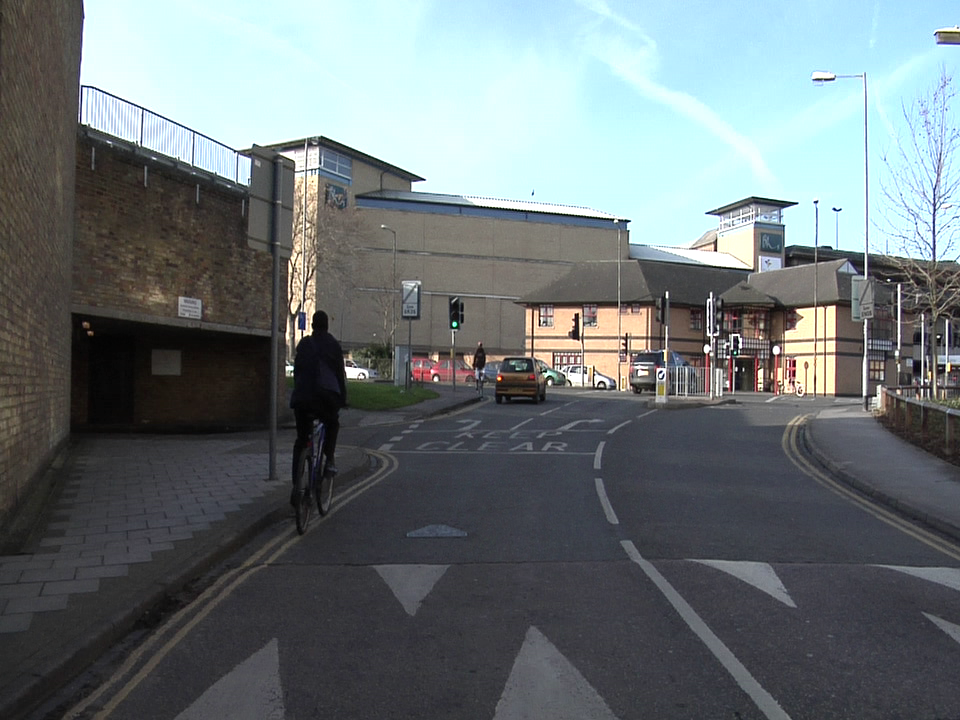

In [43]:
img_in

# Depth for road vision

Depth estimation is the task of giving the distance of each pixel to the camera. It is key in domains like autonomous driving, where the car needs to understand how far are each components.

NOTE: this algorithm was trained on autonomous driving datasets, and therefore will not work well on images that are not similar to what a car sees on the road.

In [44]:
name_img='test_img.png'
model_name='depth-bts'

In [45]:
r = fileImgAPICall(name_img,f'depth/{model_name}/')

assert r.status_code==200

Elapsed time: 10.803519487380981


In [46]:
img_out = response2img(r)

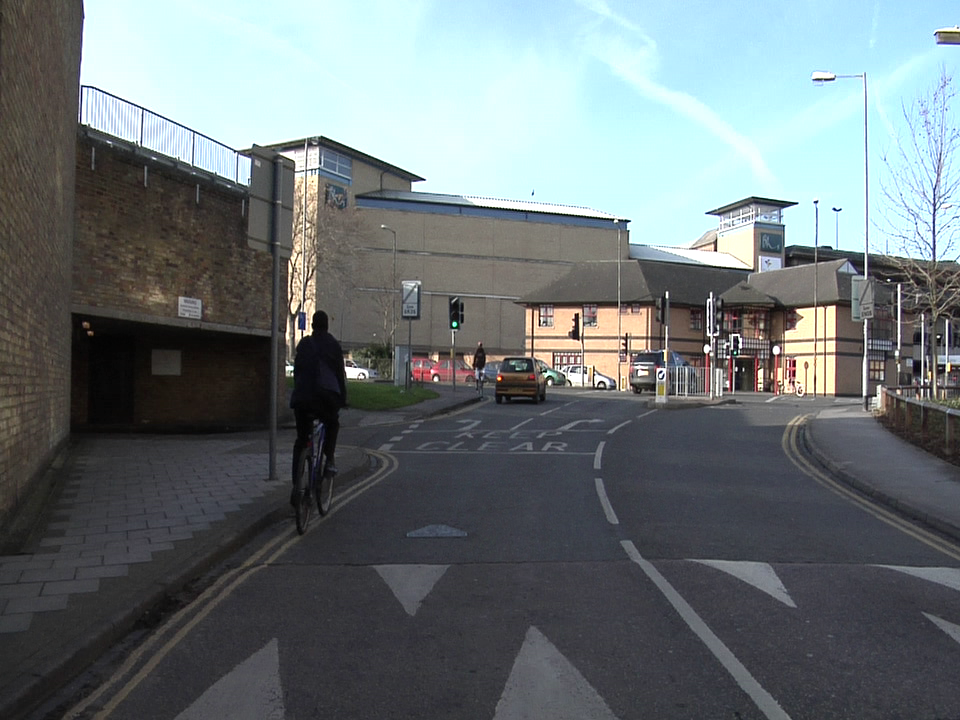

In [47]:
img_in = Image.open(name_img)
img_in

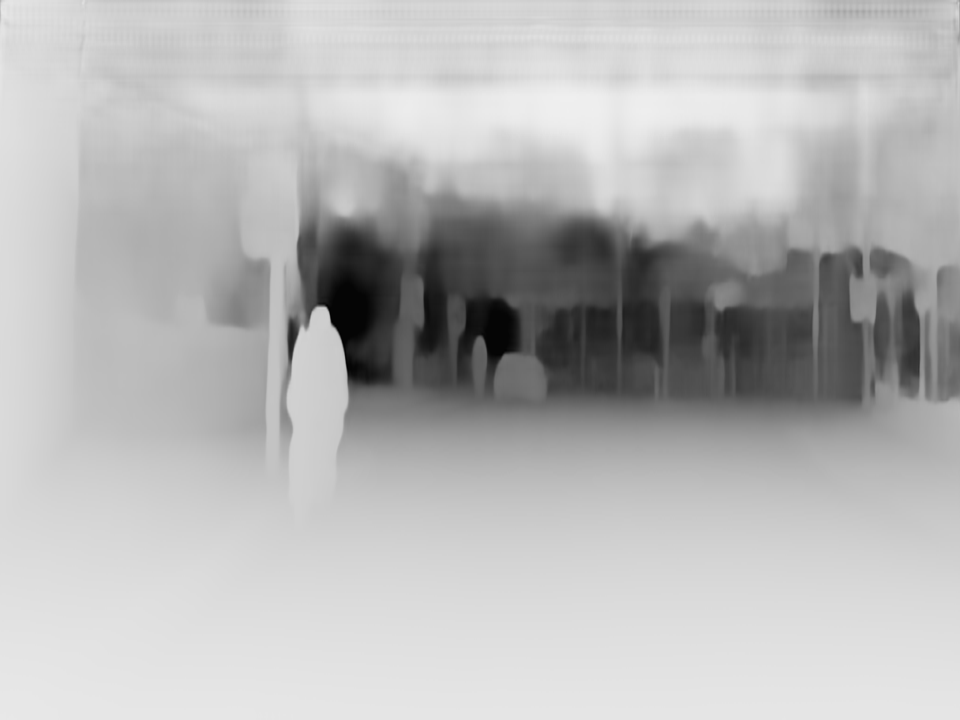

In [48]:
img_out

Below is a normalized version, mostly for "demo" purpose. It is recommended to use the real version if you are really interested by the depth.

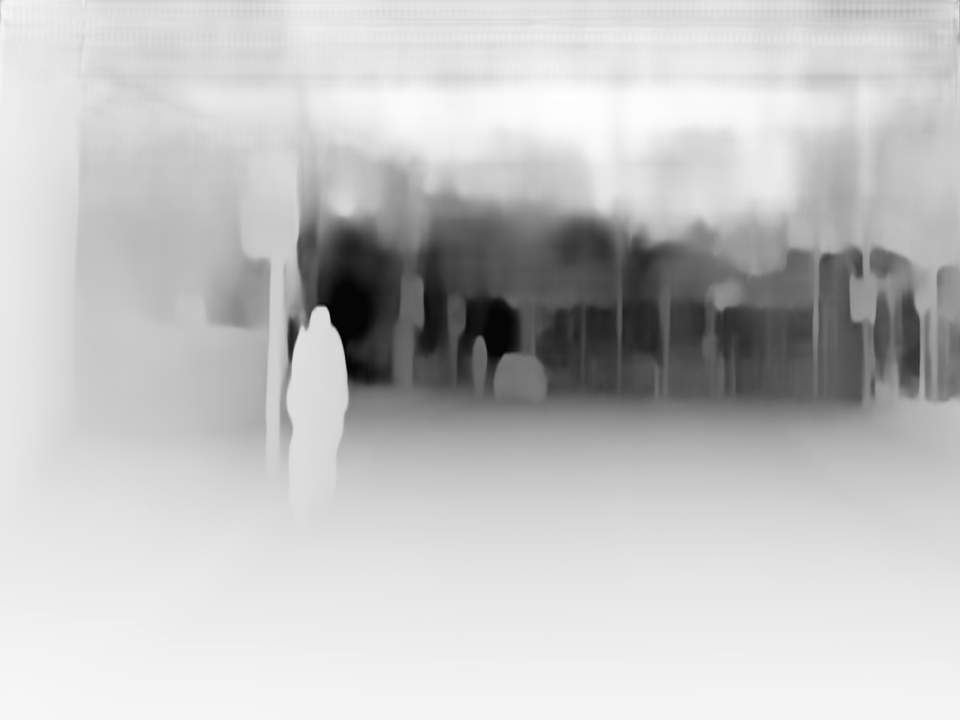

In [49]:
img_out2=normalize(img_out)
img_out2

In [50]:
img_out.save(f'./img_out/{model_name}.png')